## 1. DATA LOAD

In [1]:
import pandas as pd
import pandas_profiling
import seaborn as sns

#load in constants such as data paths and locations
from constants import TRAIN_DIR, TRAIN_REPORT_PATH
#load the raw data
data = pd.read_csv(TRAIN_DIR)

## 2. DATA QUALITY CHECKS

Let us begin by loading the raw data and generating basic summary statistics. In a time crunch situation, it is better to use libraries to help us achieve this, rather than writing all the code ourselves - hence we will use pandas profilers

### Observations:
1. "Unnamed: 0" seems to be a masked column potentially denoting customer ids as it has as many unique values as the row count of the data
2. We don't see any "arrivalYear" column, so it's not clear whether this data spans across just a single year or multiple years
3. The only customer history available is number of past bookings and cancellations - there is no information on other details like booking duration, number of members etc. Thus all information for a single customer is captured via a single row.
4. Numerical data seems relatively clean - no negative values are seen. "Children" needs to be converted to a numeric column.
5. Most categorical variables are masked, and so a deep dive into their behaviour is key.
6. "Country" has high cardinality, and so special handling of this column (such as embeddings) may be required 

### TODOs:
1. Convert "children" to a numeric data type
2. Convert "arrivalMonth" to ordinal numeric column

In [2]:
#generate the profiling report
dataReport = pandas_profiling.ProfileReport(data, title="Train Data Report")
#write the report to disk
#dataReport.to_file(TRAIN_REPORT_PATH)
#view the report
dataReport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
#convert the children column to int. for now, we can cast missing values in this column as 0
data['chidren'] = data['chidren'].fillna('0').astype(int)
#convert arrivalMonth to numeric
data['arrivalMonth'].replace({'July':7, 'August':8, 'September':9, 'October':10, 'November':11, 'December':12,'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6},inplace = True)
data['arrivalMonth'] = data['arrivalMonth'].astype(int)

## 3. Data Exploration

Below are a few distributions (non exhaustive) we would like to understand:

1. Seasonal Demand / Booking volumes
2. Cancellation behaviour due to seasonal factors, demographics, geography and booking types
3. Distribution of time difference between booking of a hotel and the check-in date
4. Booking behaviour (cancellation rates, volumes, stay lengths, average no of people) by customer demographics
5. Relation between number of requests, deposit types and cancellations

<AxesSubplot:xlabel='arrivalMonth', ylabel='Count'>

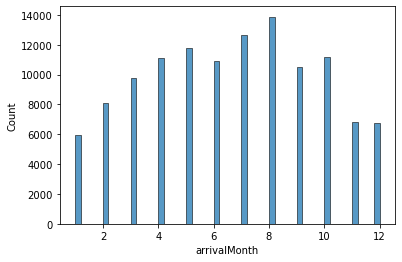

In [32]:
%matplotlib inline
sns.histplot(data, x='arrivalMonth')

<AxesSubplot:xlabel='numberNights', ylabel='Count'>

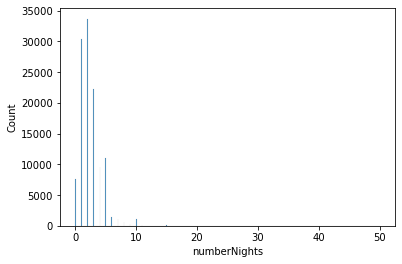

In [29]:
sns.histplot(data,x='numberNights')

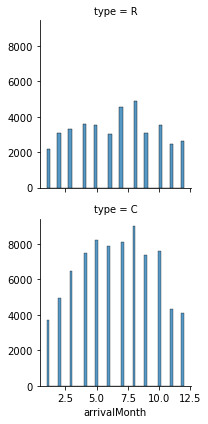

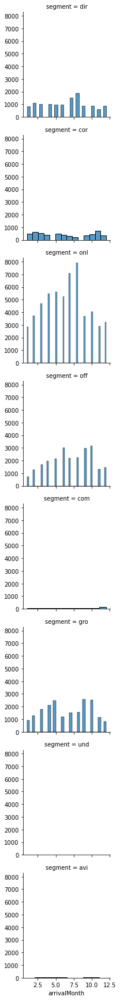

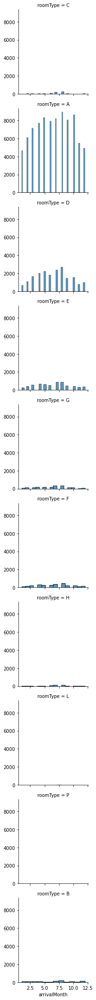

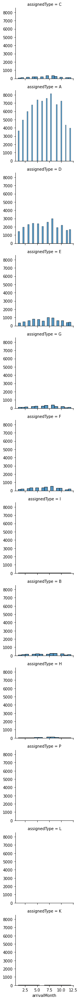

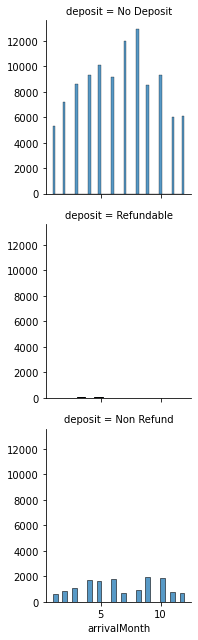

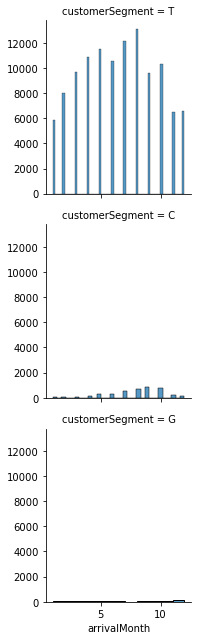

In [62]:
#seasonal demand split by various demographic and segment variables
for col in [col for col in data.columns if data[col].dtype=="O"]:
    if col not in ['country']:
        g = sns.FacetGrid(data, row=col)
        g.map(sns.histplot, "arrivalMonth")

<AxesSubplot:xlabel='customerSegment', ylabel='Count'>

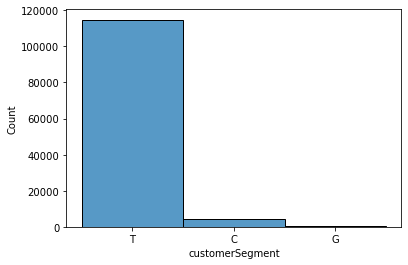

In [45]:
sns.histplot(data,x='customerSegment')

<AxesSubplot:xlabel='segment', ylabel='Count'>

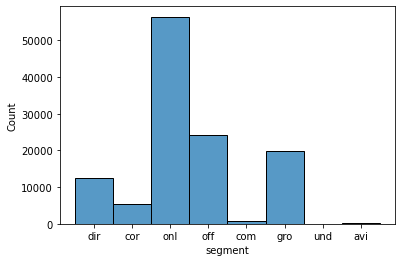

In [6]:
sns.histplot(data,x='segment')

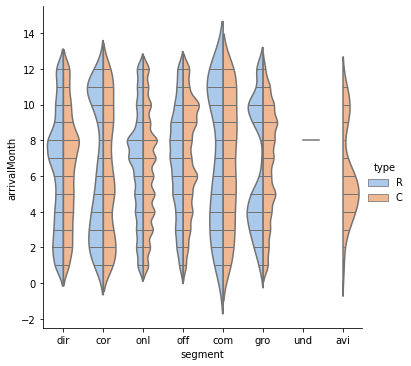

In [47]:
sns.catplot(x="segment", y="arrivalMonth", hue="type",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

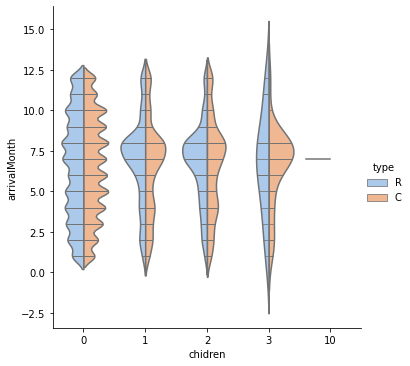

In [8]:
sns.catplot(x="chidren", y="arrivalMonth", hue="type",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

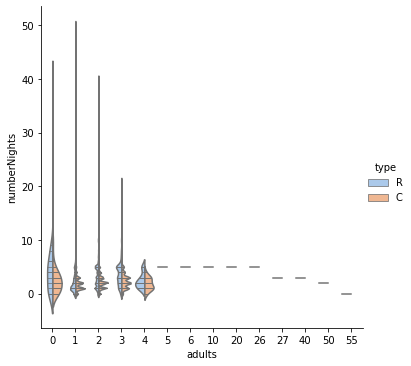

In [9]:
sns.catplot(x="adults", y="numberNights", hue="type",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

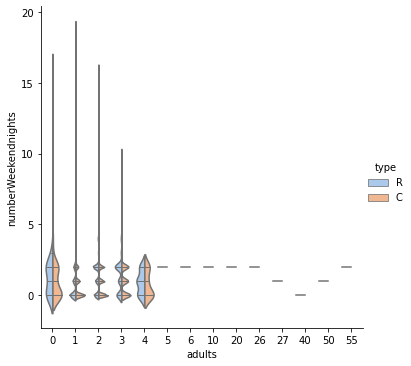

In [12]:
sns.catplot(x="adults", y="numberWeekendnights", hue="type",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

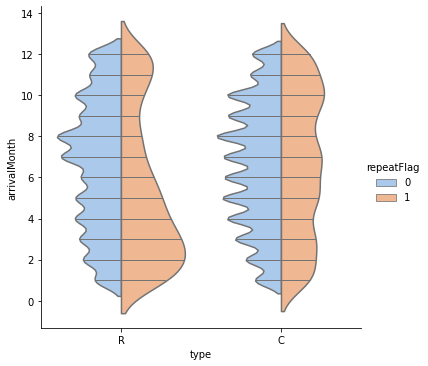

In [14]:
sns.catplot(x="type", y="arrivalMonth", hue="repeatFlag",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

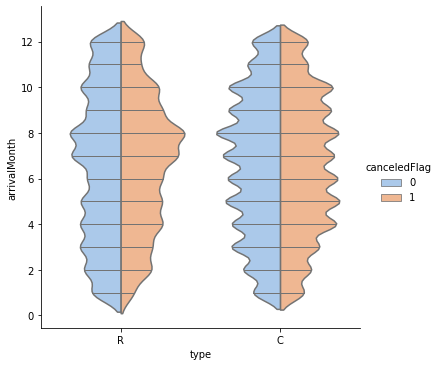

In [15]:
sns.catplot(x="type", y="arrivalMonth", hue="canceledFlag",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=data)

<AxesSubplot:xlabel='numberNights', ylabel='canceledFlag'>

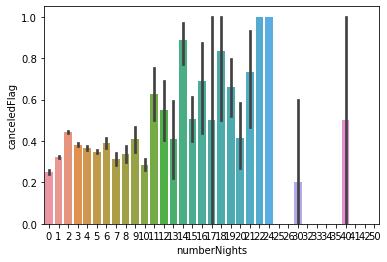

In [40]:
sns.barplot(x='numberNights', y='canceledFlag',data = data)

<AxesSubplot:xlabel='arrivalMonth', ylabel='canceledFlag'>

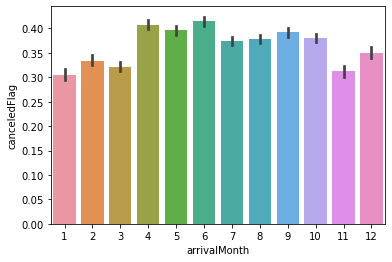

In [38]:
sns.barplot( x='arrivalMonth', y='canceledFlag',data = data)

<AxesSubplot:xlabel='numberofRequests', ylabel='canceledFlag'>

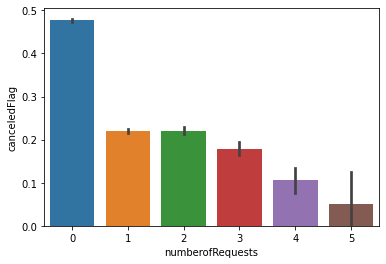

In [37]:
sns.barplot( x='numberofRequests', y='canceledFlag',data = data)

<AxesSubplot:xlabel='chidren', ylabel='canceledFlag'>

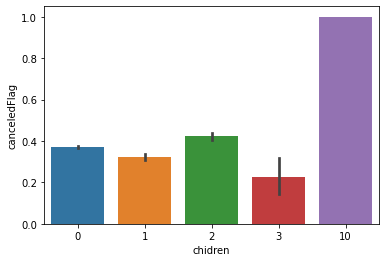

In [44]:
sns.barplot( x='chidren', y='canceledFlag',data = data)

<AxesSubplot:xlabel='adults', ylabel='canceledFlag'>

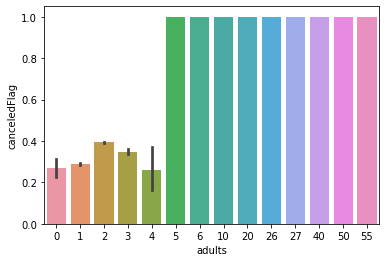

In [45]:
sns.barplot( x='adults', y='canceledFlag',data = data)

<AxesSubplot:xlabel='type', ylabel='canceledFlag'>

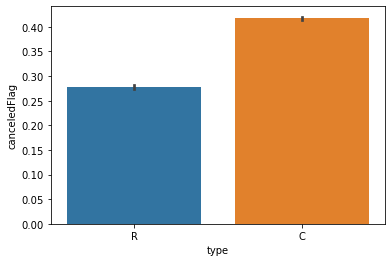

In [46]:
sns.barplot( x='type', y='canceledFlag',data = data)

<AxesSubplot:xlabel='segment', ylabel='canceledFlag'>

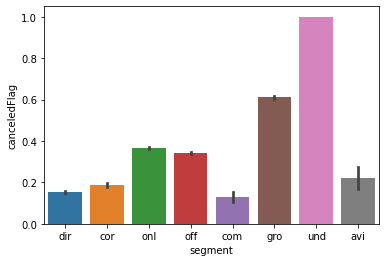

In [48]:
sns.barplot( x='segment', y='canceledFlag',data = data)

<AxesSubplot:xlabel='repeatFlag', ylabel='canceledFlag'>

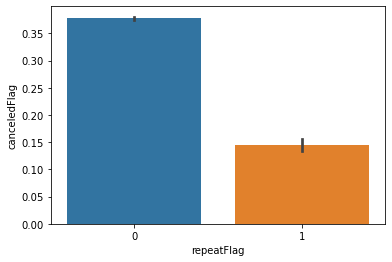

In [49]:
sns.barplot( x='repeatFlag', y='canceledFlag',data = data)

<AxesSubplot:xlabel='historicCancellations', ylabel='canceledFlag'>

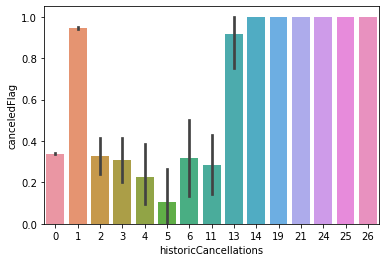

In [50]:
sns.barplot( x='historicCancellations', y='canceledFlag',data = data)

<AxesSubplot:xlabel='roomType', ylabel='canceledFlag'>

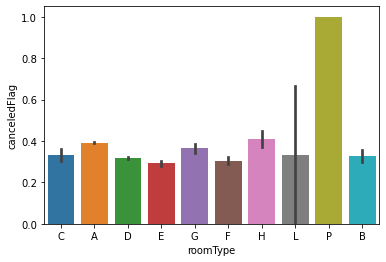

In [52]:
sns.barplot( x='roomType', y='canceledFlag',data = data)

<AxesSubplot:xlabel='assignedType', ylabel='canceledFlag'>

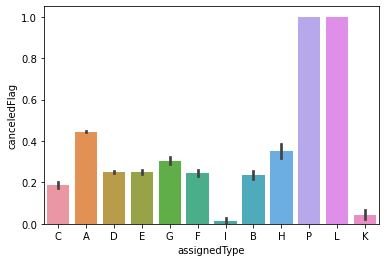

In [53]:
sns.barplot( x='assignedType', y='canceledFlag',data = data)

<AxesSubplot:xlabel='changesFlag', ylabel='canceledFlag'>

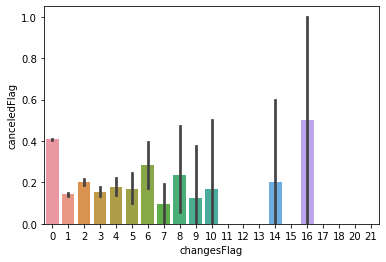

In [54]:
sns.barplot( x='changesFlag', y='canceledFlag',data = data)

<AxesSubplot:xlabel='deposit', ylabel='canceledFlag'>

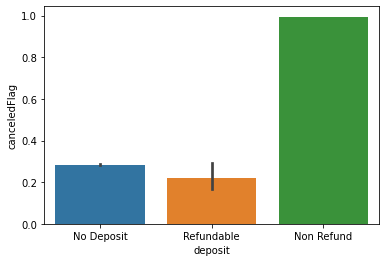

In [55]:
sns.barplot( x='deposit', y='canceledFlag',data = data)

<AxesSubplot:xlabel='customerSegment', ylabel='canceledFlag'>

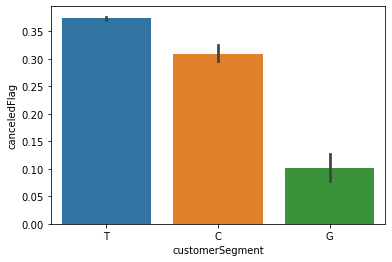

In [56]:
sns.barplot( x='customerSegment', y='canceledFlag', data = data)

## Observations

Based on the visuals generated above, a few conclusions can be drawn:

1. Demand for hotel bookings is seasonal with majority (31%) of bookings coming during Q3
2. Average booking length is around 2.5 days
3. 66% of booking volumes are driven by the demographic 'C'
4. On an average, bookings are made 3 months in advance (assuming time2checkin is measured in days). However this distribution is skewed, with 25% of bookings done within 18 days of travel. In fact, roughly 5% of bookings are made on the same day.
5. Differences exist in demand trends for bookings with and without children. It can be hypothesized that bookings that include children are primarily vacations, while adults only trips are work related trips
6. Without knowledge on the meaning of the segment and customerSegment categories, it is difficult to draw conclusions on these variables
7. Average cancellation rate is 37%. Higher than average cancellations are observed during April - August.
8. The more the number of requests, the lesser is the chance of cancellation
9. Clear relation between duration of stay and cancellations not observed. However, longer stays are more likely to be cancelled. Perhaps can be attributed to incorrect details supplied during booking
10. Cancellation behaviour of 'C' demographic is higher than 'R' type
11. Differing cancellation trends observed across various segments
12. Repeat bookings are less likely to be cancelled. Perhaps this has something to do with work related trips or preferred holiday destinations
13. No clear cancellation trend observed across room type. It suggests that there is not a significant difference in cancellation behaviour across premium hotels versus budget friendly hotels.
14. Cancellation trends differ across deposit types, however the meaning of these categories aren't clear. Usually if a booking is non refundable, it would have a lesser cancellation trend since customers have already paid an advance. It would be wise to avoid using this variable until it is better understood, especially since it might also be leaking some information about cancellations